# Classification of Caltech Dataset Birds
* This works makes use of mlp network and rsnet101

## Data Description and Preparation
Dataset: <a href="http://www.vision.caltech.edu/visipedia/CUB-200-2011.html">Caltech-UCSD Birds-200-2011</a> (Also posed on Brightspace)

* A subset of 150*32 images were used for the training
* A subset of 30*32 images were used for the validation

The dataset contains annotations for various tasks. In this work, the categories for classification (species labels) were exploited.



In [ ]:
# Prepare your dataset here
import tensorflow as tf
import keras
directory='CUB_200_2011/images'



### Data Vsiualization

C:\Users\hassa\Downloads\A2_cv\CUB_200_2011\images\001.Black_footed_Albatross
200
1000


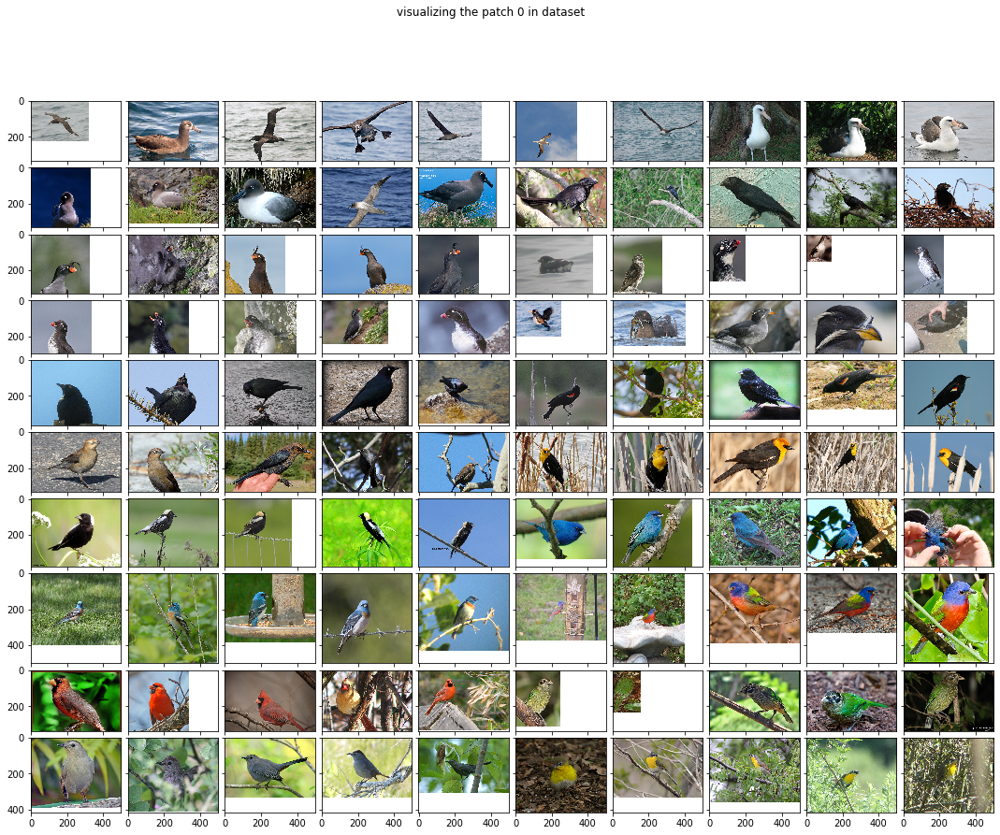

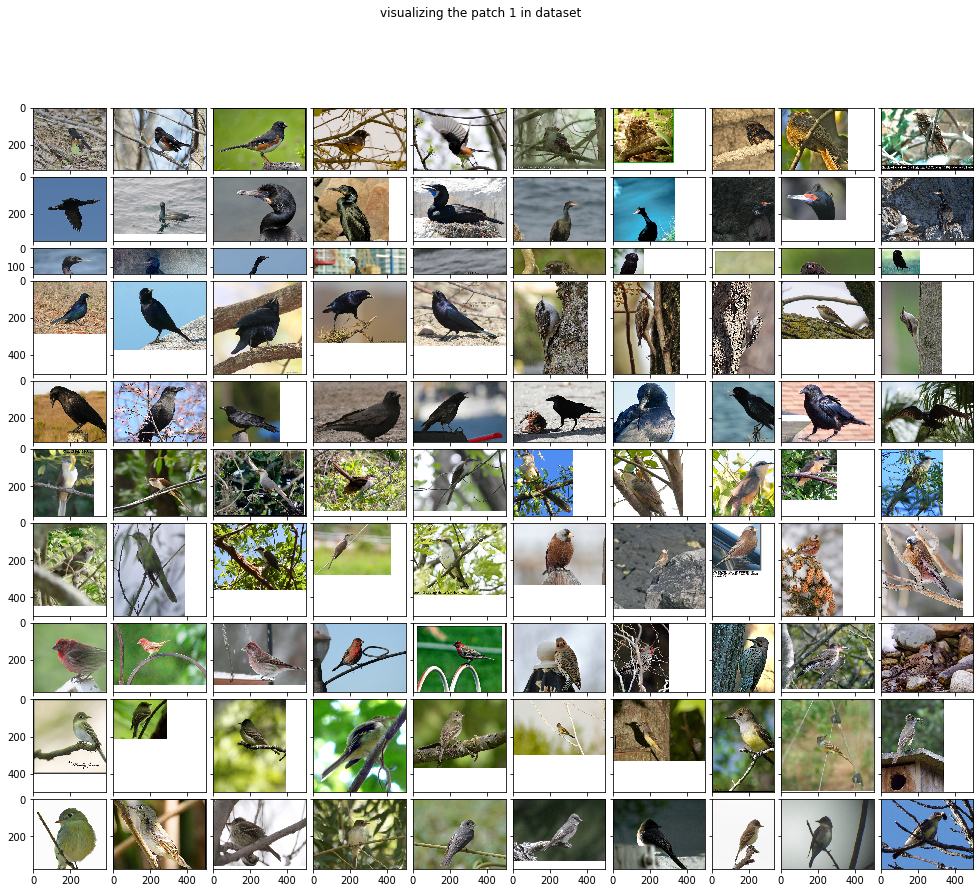

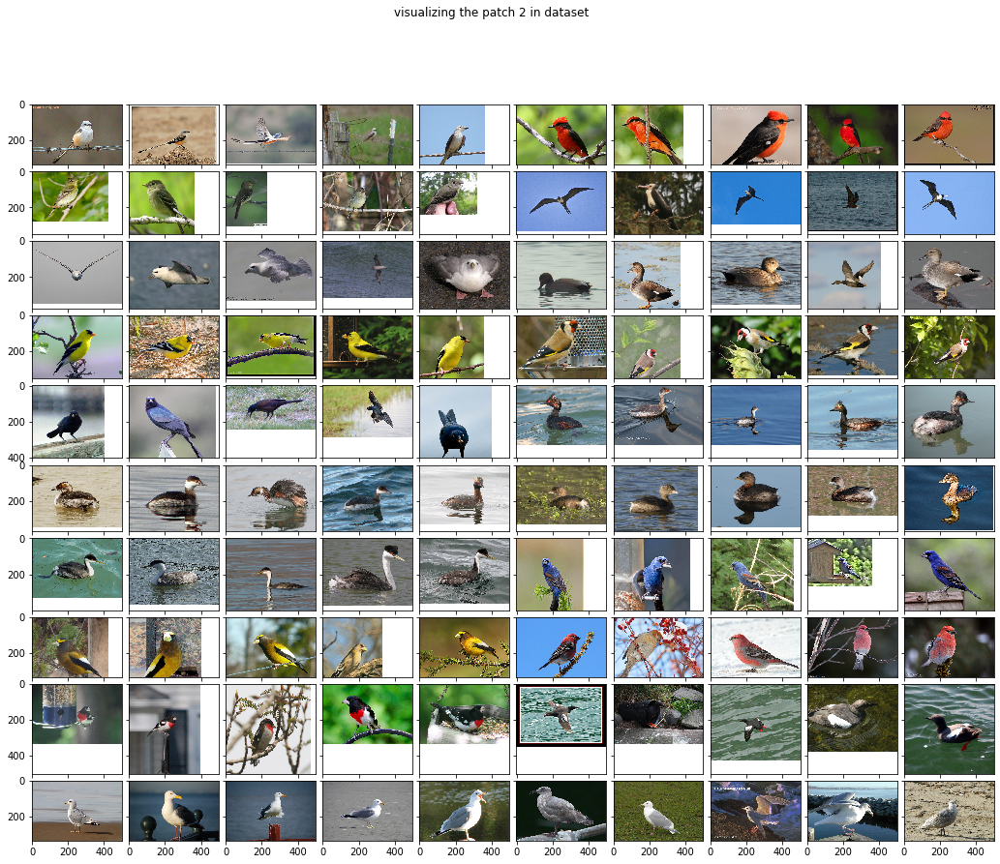

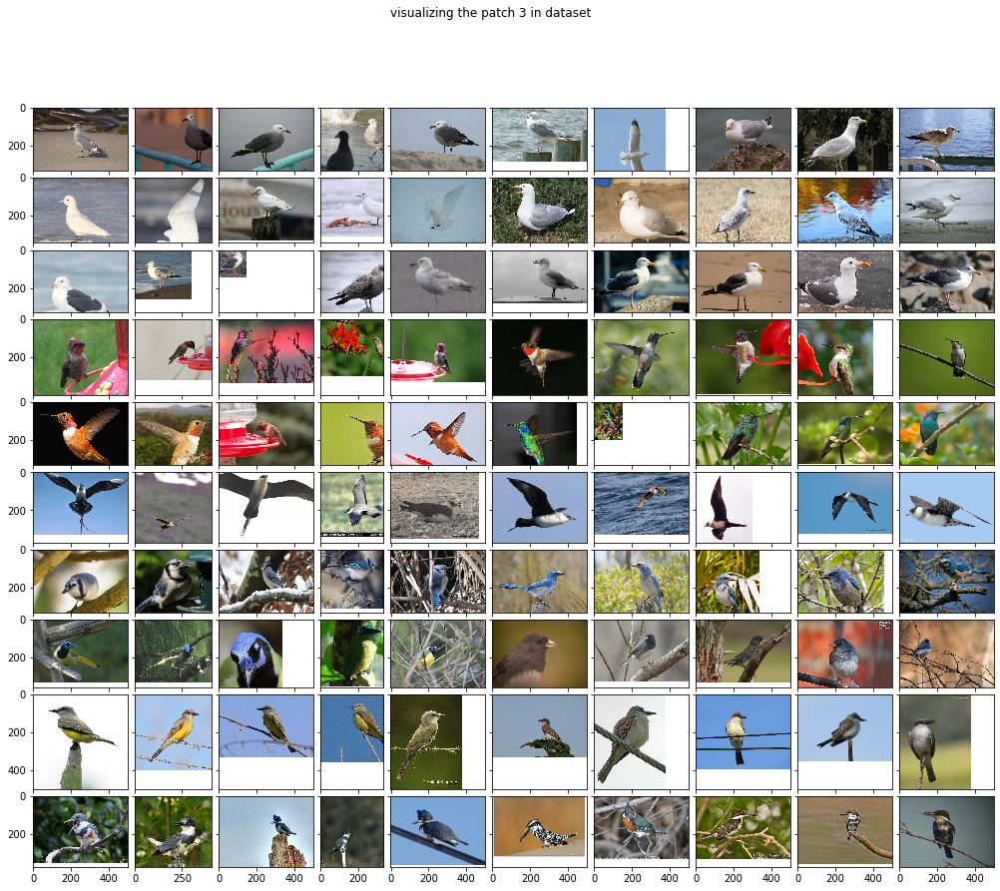

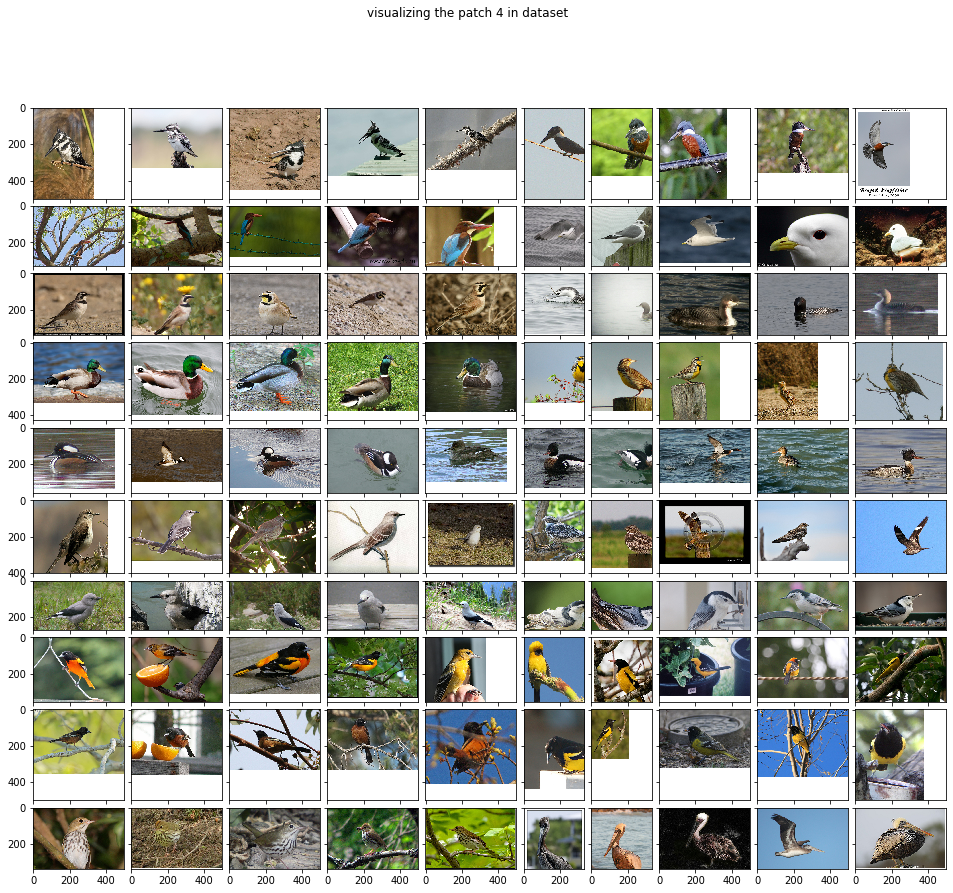

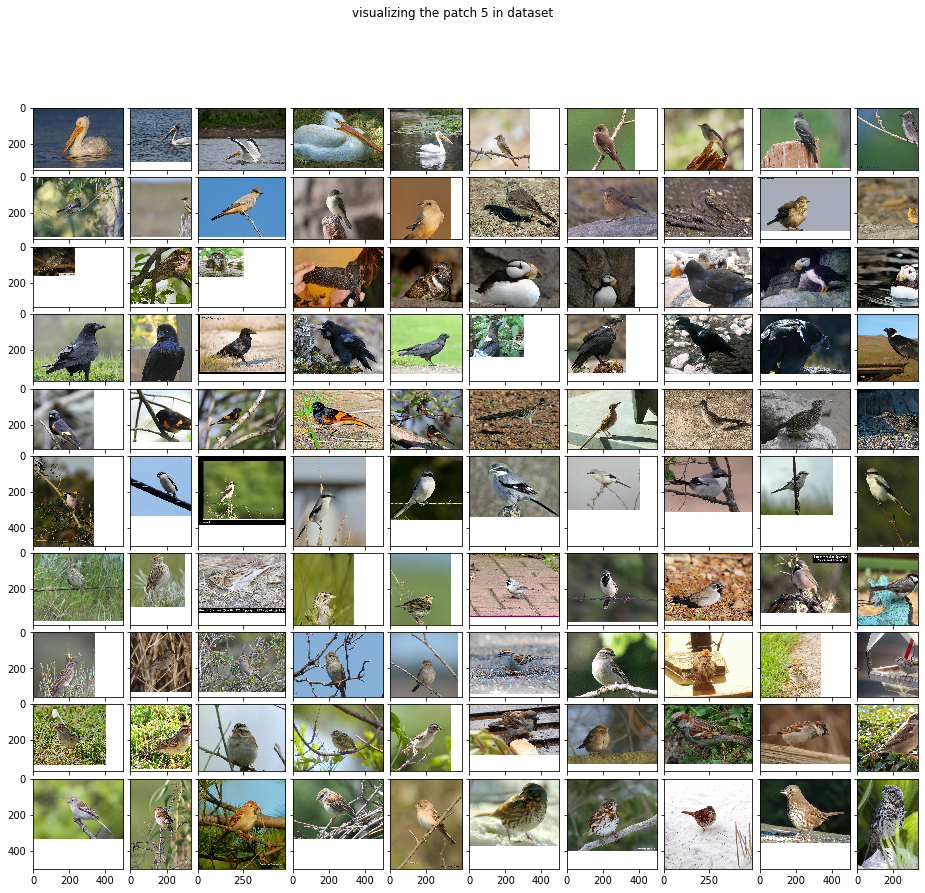

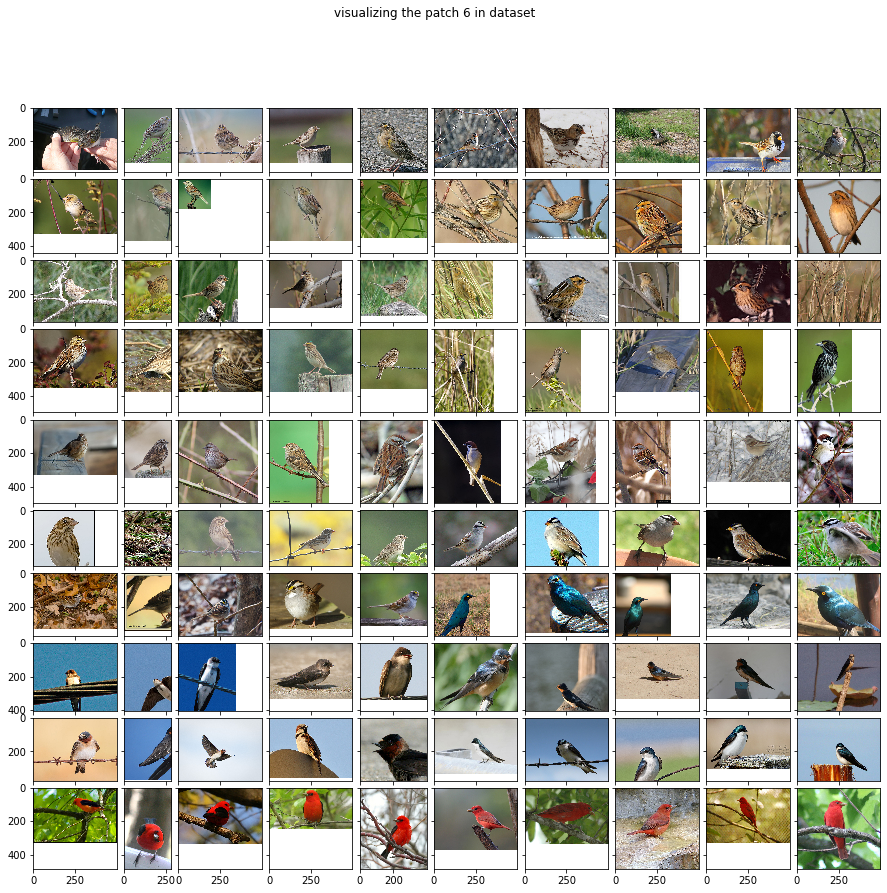

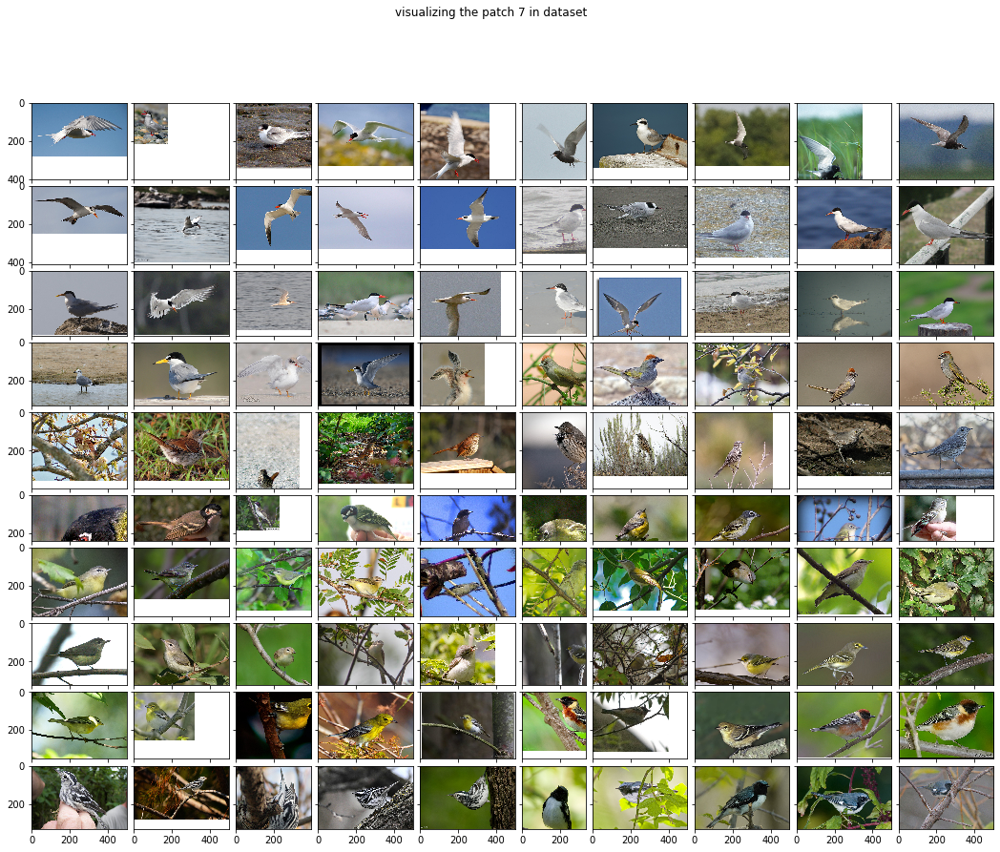

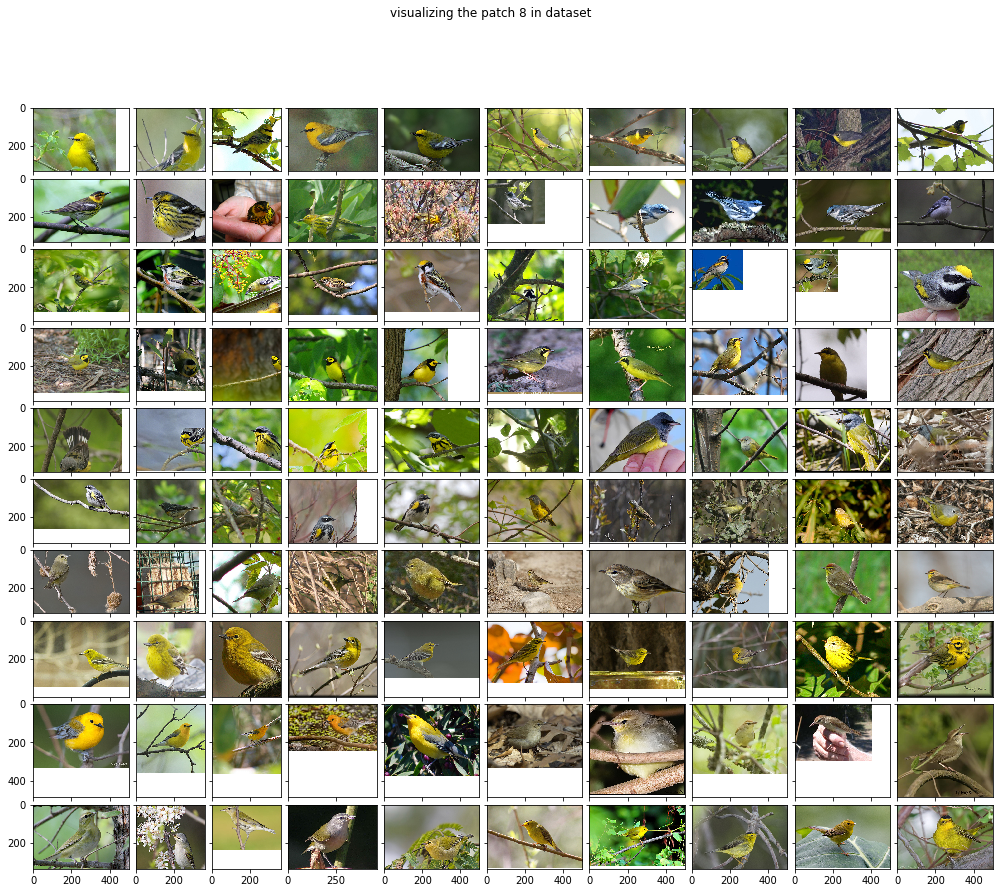

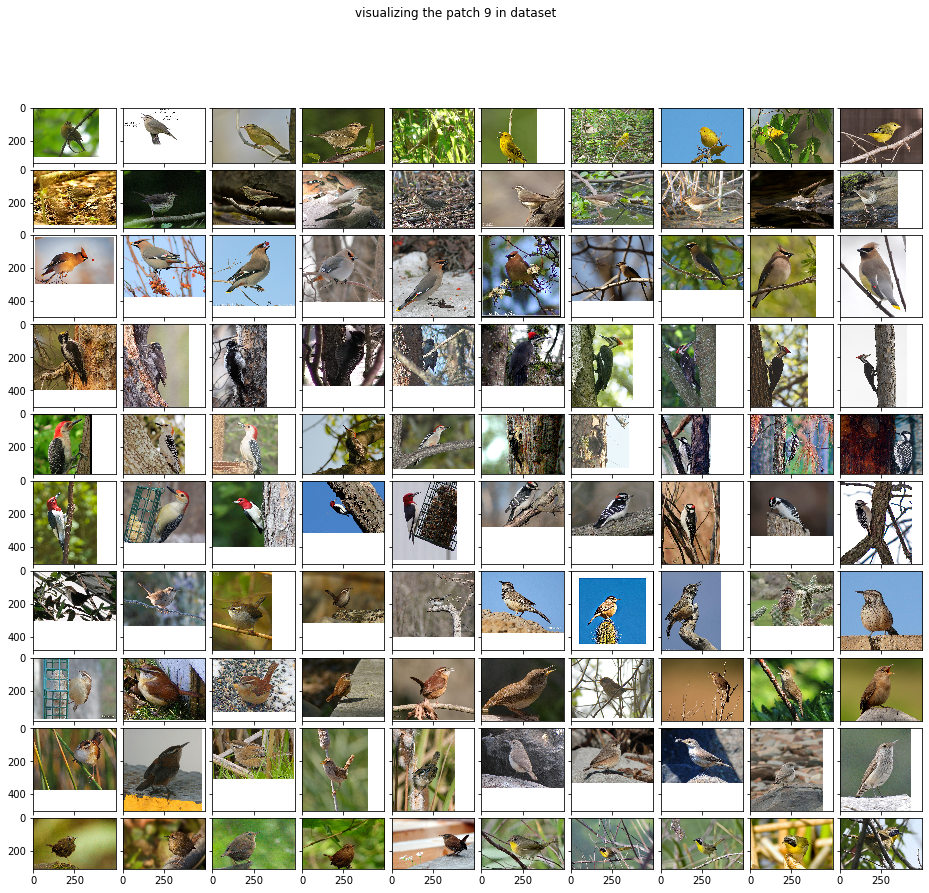

In [45]:
import pathlib
import numpy as np
import matplotlib
from mpl_toolkits.axes_grid1 import ImageGrid
import matplotlib.pyplot as plt
data_dir = pathlib.Path(directory)
images_list=list(data_dir.glob('*/*.jpg'))
classes_list=list(data_dir.glob('*'))
print(classes_list[0])
print(len(classes_list))

list_imgs=[]

for label in classes_list:
    class_list=list(label.glob('*.jpg'))
    for j in range(5):
        list_imgs.append(class_list[j])
     
      

print(len(list_imgs))     
for i in range(10):       
    limgs=list_imgs[i*100:(i+1)*100]
    fig = plt.figure(figsize=(25., 14.))
    fig.suptitle(f"visualizing the patch {i} in dataset")
    grid = ImageGrid(fig, 111,  # similar to subplot(111)
                    nrows_ncols=(10, 10),  # creates 2x2 grid of axes
                    axes_pad=0.1,  # pad between axes in inch.
                    )

    for ax, im in zip(grid, limgs):
        # Iterating over the grid returns the Axes.
        im=plt.imread(im)
        ax.imshow(im, interpolation='none', cmap=plt.cm.gray)
    plt.title(f"visualizing the patch {i} in dataset")
    plt.show()

### Auxiliary Function

In [12]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.python.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt
from tensorflow.keras import optimizers

epochs_num=20
size_batch=32
train_take=150 #number of batches to take
valid_take=30
def compile_fit_plot(train_ds,valid_ds,model,opt,epochs_num,size_batch,model_name):
    
    cb_early_stopper = EarlyStopping(monitor = 'accuracy', patience = 4)
    model.compile(
    loss = tf.keras.losses.CategoricalCrossentropy(),
    optimizer = opt,
    metrics=['accuracy']#metrics = [tf.keras.metrics.CategoricalCrossentropy()]
    )

    # Train the model
    history = model.fit(
        train_ds, 
        epochs=epochs_num,
        batch_size=size_batch,
        validation_data =valid_ds,
        callbacks=[cb_early_stopper],
        verbose=1
    )
    

    f=plt.subplot(2,1,1)
    f.figure.set_size_inches(30,10)
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.legend(['train acc', 'test acc when treated as val']) 
    plt.title(f"Accuracies For {model_name}")
    plt.xlabel("# of epochs")
    plt.ylabel("accuracy")
    
    plt.grid()
    f=plt.subplot(2,1,2)
    f.figure.set_size_inches(30,10)
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.legend(['train loss', 'test loss when treated as val'])
    plt.xlabel("# of epochs")
    plt.title(f"losses For {model_name}")
    
    plt.grid()
    plt.show()
    return model

## MLP
This section shows the implemention of a fully connected neural network (multi-layer perceptron).
- The images resize to be no larger than 32x32.
- Through, sequential model API in keras, dense layers were added 



Found 11788 files belonging to 200 classes.
Using 9431 files for training.
Found 11788 files belonging to 200 classes.
Using 2357 files for validation.
Epoch 1/20
150/150 [==============================] - 2s 8ms/step - loss: 5.3220 - accuracy: 0.0054 - val_loss: 5.3120 - val_accuracy: 0.0055
Epoch 2/20
150/150 [==============================] - 1s 7ms/step - loss: 5.2926 - accuracy: 0.0054 - val_loss: 5.3095 - val_accuracy: 0.0059
Epoch 3/20
150/150 [==============================] - 1s 8ms/step - loss: 5.2800 - accuracy: 0.0083 - val_loss: 5.3066 - val_accuracy: 0.0064
Epoch 4/20
150/150 [==============================] - 1s 7ms/step - loss: 5.2678 - accuracy: 0.0094 - val_loss: 5.3089 - val_accuracy: 0.0064
Epoch 5/20
150/150 [==============================] - 1s 8ms/step - loss: 5.2564 - accuracy: 0.0115 - val_loss: 5.3058 - val_accuracy: 0.0042
Epoch 6/20
150/150 [==============================] - 1s 7ms/step - loss: 5.2451 - accuracy: 0.0154 - val_loss: 5.3036 - val_accuracy: 0.0

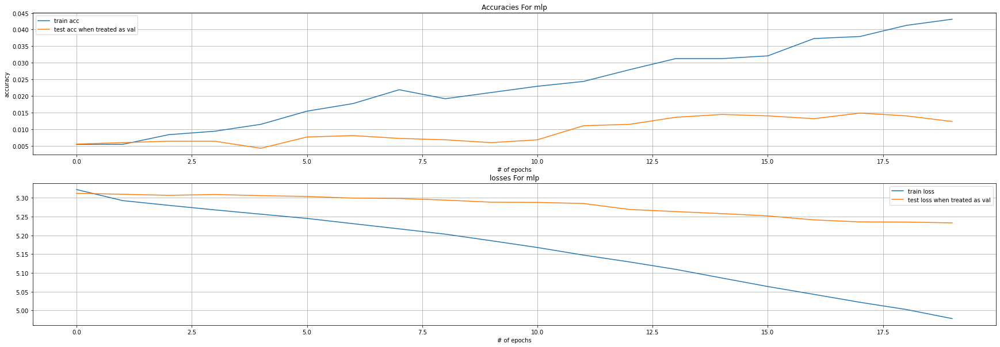

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_3 (Rescaling)     (None, 32, 32, 1)         0         
                                                                 
 flatten_6 (Flatten)         (None, 1024)              0         
                                                                 
 dense_12 (Dense)            (None, 2048)              2099200   
                                                                 
 leaky_re_lu_3 (LeakyReLU)   (None, 2048)              0         
                                                                 
 dense_13 (Dense)            (None, 512)               1049088   
                                                                 
 flatten_7 (Flatten)         (None, 512)               0         
                                                                 
 dense_14 (Dense)            (None, 200)              

In [13]:
train=tf.keras.utils.image_dataset_from_directory(directory,labels='inferred', label_mode='categorical',validation_split=0.2,
                                                    seed=20,subset='training',color_mode='grayscale',batch_size=size_batch, 
                                                  image_size=(32, 32), shuffle=True)
valid=tf.keras.utils.image_dataset_from_directory(directory,labels='inferred', label_mode='categorical',validation_split=0.2,
                                                    seed=20,subset='validation',color_mode='grayscale',batch_size=size_batch, 
                                                  image_size=(32, 32), shuffle=True)

train_subset=train.take(train_take)
valid_subset=valid.take(valid_take)
model_mlp = Sequential([
  layers.Rescaling(1./255),
  layers.Flatten(),
  #layers.Dense(2048, activation='relu'),
  layers.Dense(2048),
  layers.LeakyReLU(),
  layers.Dense(512, activation='relu'),
  layers.Flatten(),
  layers.Dense(200,'softmax' ), 
])
compile_fit_plot(train_subset,valid,model=model_mlp,opt=tf.keras.optimizers.SGD(),
                 epochs_num=epochs_num,size_batch=size_batch,model_name="mlp")
model_mlp.summary()

## MLP Discussion
- Although, the MLP seems to be learning from the pixel values entered to the model, it has no ability to generalize for the test data.as seen in graph: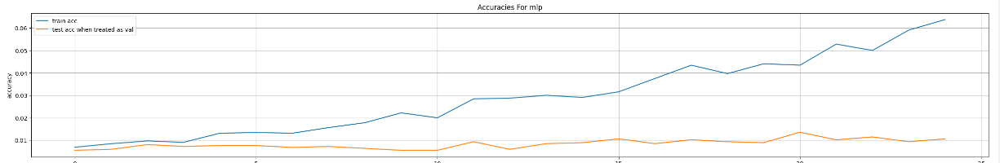.
- The validation loss shows almost no improvement over 25 epoches as shown: 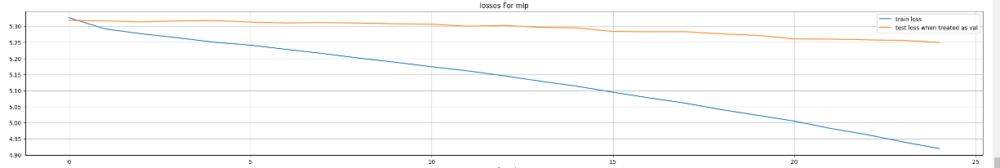
- MLP isn't the best approach for image classification, it needs too much tuning for slight improvements.
- Gray scale pixels at specific index do not carry much information for the model to learn from.
- Resizing images to 32*32 results in too much info being droped out of the image.
- Each epoch takes 1s to train on 4800 images on saturn cloud with no dedicated GPU.

## ResNet-101 

### Fully Freezed ResNet101 and Transfer Learning

- Usage of transfer learning by replacing the top fully connected layer with a dense containing 200 neorons (number of categories), but leaving the other layers intact.





Found 11788 files belonging to 200 classes.
Using 9431 files for training.
Found 11788 files belonging to 200 classes.
Using 2357 files for validation.
Epoch 1/20
150/150 [==============================] - 109s 700ms/step - loss: 4.0654 - accuracy: 0.1700 - val_loss: 3.1426 - val_accuracy: 0.2979
Epoch 2/20
150/150 [==============================] - 103s 689ms/step - loss: 1.8841 - accuracy: 0.5312 - val_loss: 2.7809 - val_accuracy: 0.3375
Epoch 3/20
150/150 [==============================] - 104s 692ms/step - loss: 1.1756 - accuracy: 0.6994 - val_loss: 2.5979 - val_accuracy: 0.3844
Epoch 4/20
150/150 [==============================] - 104s 692ms/step - loss: 0.7837 - accuracy: 0.8196 - val_loss: 2.5342 - val_accuracy: 0.3844
Epoch 5/20
150/150 [==============================] - 104s 695ms/step - loss: 0.5629 - accuracy: 0.8927 - val_loss: 2.4259 - val_accuracy: 0.4167
Epoch 6/20
150/150 [==============================] - 104s 694ms/step - loss: 0.4146 - accuracy: 0.9335 - val_loss: 2.

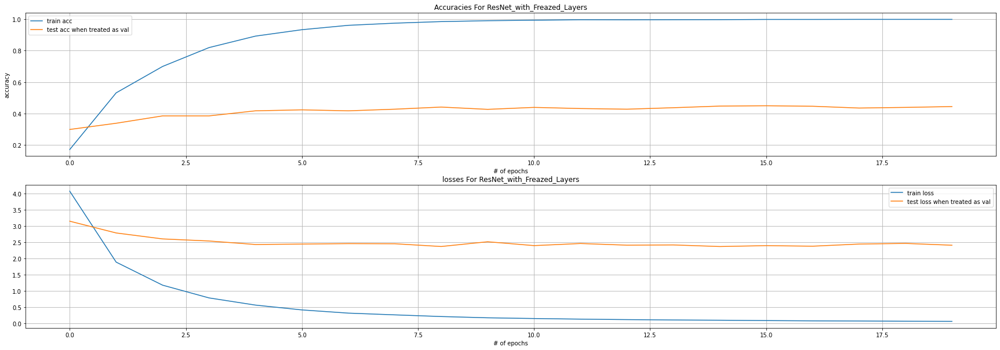

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet101 (Functional)      (None, 2048)              42658176  
                                                                 
 dense_15 (Dense)            (None, 200)               409800    
                                                                 
Total params: 43,067,976
Trainable params: 409,800
Non-trainable params: 42,658,176
_________________________________________________________________


In [14]:

import tensorflow as tf
from tensorflow.keras.applications import ResNet101
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
import keras
directory='CUB_200_2011/images'
train_resnet=tf.keras.utils.image_dataset_from_directory(directory,labels='inferred', label_mode='categorical',validation_split=0.2,
                                                    seed=20,subset='training',color_mode='rgb',batch_size=size_batch, 
                                                  image_size=(224, 224), shuffle=True)
valid_resnet=tf.keras.utils.image_dataset_from_directory(directory,labels='inferred', label_mode='categorical',validation_split=0.2,
                                                    seed=20,subset='validation',color_mode='rgb',batch_size=size_batch, 
                                                  image_size=(224, 224), shuffle=True)
train_ressubset=train_resnet.take(train_take)
valid_ressubset=valid_resnet.take(valid_take)
model_res_freeze = Sequential()
model_res_freeze.add(ResNet101(include_top = False,pooling= 'avg', weights = 'imagenet'))
model_res_freeze.add(Dense(200, activation = 'softmax'))
# Say not to train first layer (ResNet) model as it is already trained
model_res_freeze.layers[0].trainable = False
sgd = optimizers.SGD(learning_rate = 0.01, decay = 1e-6, momentum = 0.9, nesterov = True)
compile_fit_plot(train_ressubset,valid_ressubset,model=model_res_freeze,opt=sgd,
               epochs_num=epochs_num,size_batch=size_batch,model_name="ResNet_with_Freazed_Layers")
model_res_freeze.summary()

### ResNet101 with Unfreezed Three Layers
- three layers at different locations were unfreezed to study the impact of tuning

Found 11788 files belonging to 200 classes.
Using 9431 files for training.
Found 11788 files belonging to 200 classes.
Using 2357 files for validation.
Epoch 1/20
150/150 [==============================] - 228s 1s/step - loss: 5.2896 - accuracy: 0.0146 - val_loss: 5.1283 - val_accuracy: 0.0208
Epoch 2/20
150/150 [==============================] - 221s 1s/step - loss: 4.6301 - accuracy: 0.0746 - val_loss: 4.0767 - val_accuracy: 0.1219
Epoch 3/20
150/150 [==============================] - 221s 1s/step - loss: 3.1834 - accuracy: 0.2560 - val_loss: 3.0152 - val_accuracy: 0.2885
Epoch 4/20
150/150 [==============================] - 221s 1s/step - loss: 2.1678 - accuracy: 0.4606 - val_loss: 2.9176 - val_accuracy: 0.3073
Epoch 5/20
150/150 [==============================] - 221s 1s/step - loss: 1.5788 - accuracy: 0.5758 - val_loss: 2.5703 - val_accuracy: 0.3646
Epoch 6/20
150/150 [==============================] - 221s 1s/step - loss: 1.1154 - accuracy: 0.6865 - val_loss: 2.6188 - val_accurac

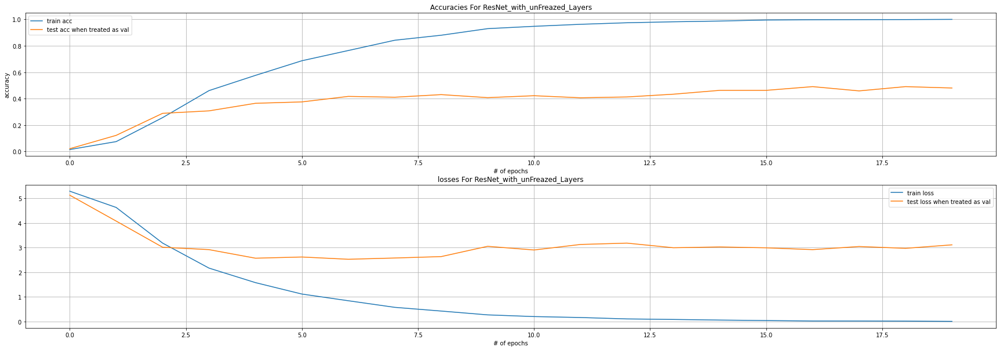

In [16]:
#resnet unfreezed
from tensorflow.keras.models import Model
from tensorflow.keras.applications import ResNet101
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
directory='CUB_200_2011/images'
train_resnet=tf.keras.utils.image_dataset_from_directory(directory,labels='inferred', label_mode='categorical',validation_split=0.2,
                                                    seed=20,subset='training',color_mode='rgb',batch_size=size_batch, 
                                                  image_size=(224, 224), shuffle=True)
valid_resnet=tf.keras.utils.image_dataset_from_directory(directory,labels='inferred', label_mode='categorical',validation_split=0.2,
                                                    seed=20,subset='validation',color_mode='rgb',batch_size=size_batch, 
                                                  image_size=(224, 224), shuffle=True)
train_ressubset=train_resnet.take(train_take)
valid_ressubset=valid_resnet.take(valid_take)
model_b=ResNet101(include_top = False,pooling= 'avg', weights = 'imagenet')

#conv3_block1_2_conv is 128*128*9 each filter is 3*3
#conv4_block22_2_conv is 256*256*9
for layer in model_b.layers:
    if 'conv4_block22_2_conv' == layer.name or 'conv3_block1_2_conv' == layer.name or layer.name == 'conv1_conv':
        layer.trainable = True
    else:
        layer.trainable = False

x = model_b.output
predictions = Dense(200, activation='softmax')(x)

# this is the model we will train
model_resnet_unfreezed_layers = Model(inputs=model_b.input, outputs=predictions)

sgd = optimizers.SGD(learning_rate = 0.01, decay = 1e-6, momentum = 0.9, nesterov = True)
model_with_filters=compile_fit_plot(train_ressubset,valid_ressubset,model=model_resnet_unfreezed_layers,opt=sgd,
                epochs_num=epochs_num,size_batch=size_batch,model_name="ResNet_with_unFreazed_Layers")
#model_resnet_unfreezed_layers.summary()

## ResNet Discussion
- Resnet101 is too complex for the problem we have specially with the small sample that is used for training(4800(150*32) images).
- Images are of resized to be 224*224 according to keras docs standards
- Unfreezing three convolutional layers 'conv1_conv'(64*3*49 parameter),'conv3_block1_2_conv'(128*128*9 parameter) and 'conv4_block22_2_conv'(256*256*9 parameter) increased the         trainable parameters from 409,800 to 1,156,936, which in turn resulted in increasing the train time from almost 100s per epoch to almost 220s.
- Those three layers are chosen to be visualized later.
- Unfreezing the two layers increased the model ability to generalize for the test data.
- ResNet with all layers freezed acquired max test accuracy=0.4490 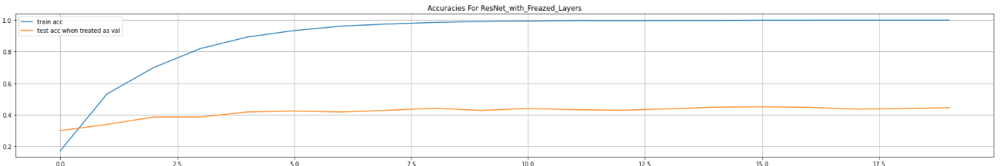
- ResNet with two unfreezed conv layers acquired max test accuracy=0.0.4906 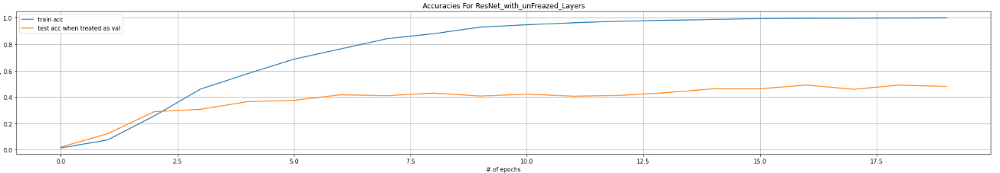
- Resnet with the unfreezed layers takes longer to learn and achieve better train accuracy results(slower learning curve).

## Visualization of ResNet unfreezed Filters

This Section contains the visualization of filters of resnet that were chosen to be unfreezed with freezing and without.
To see the impact of training and tuning.



middle filters visualization after unfreezing, first 6
conv3_block1_2_conv (3, 3, 128, 128)


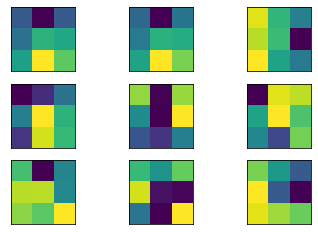

middle filters visualization before unfreezing, first 6
conv3_block1_2_conv (3, 3, 128, 128)


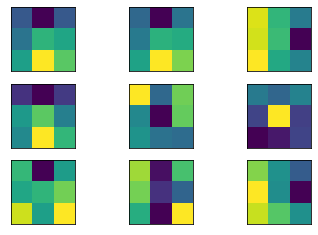

In [17]:
# Write your visualization code here.
from matplotlib import pyplot
def plot_first_6filters_oflayer(model,name_oflayer,state):
    print(state)
    for layer in model.layers:
        
        if  name_oflayer== layer.name:     
        # get filter weights
            filters, biases = layer.get_weights()
            print(layer.name, filters.shape)
            # normalize filter values to 0-1 so we can visualize them
            f_min, f_max = filters.min(), filters.max()
            filters = (filters - f_min) / (f_max - f_min)
            n_filters, ix = 3, 1
            for i in range(n_filters):
                # get the filter
                f = filters[:, :, :, i]
                # plot each channel separately
                for j in range(3):
                    ax = pyplot.subplot( n_filters,3, ix)
                    ax.set_xticks([])
                    ax.set_yticks([])
                    # plot filter channel in grayscale
                    pyplot.imshow(f[:, :, j])
                    ix += 1
            # show the figure
            pyplot.show()
plot_first_6filters_oflayer(model_with_filters,'conv3_block1_2_conv',"middle filters visualization after unfreezing, first 6")

model_resnet=ResNet101(include_top = False,pooling= 'avg', weights = 'imagenet')
for layer in model_resnet.layers:
    layer.trainable = False
plot_first_6filters_oflayer(model_resnet,'conv3_block1_2_conv',"middle filters visualization before unfreezing, first 6")      


late filters visualization after unfreezing first 6
conv4_block22_2_conv (3, 3, 256, 256)


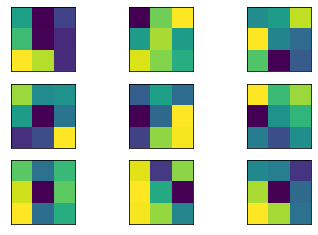

late filters visualization before unfreezing first 6
conv4_block22_2_conv (3, 3, 256, 256)


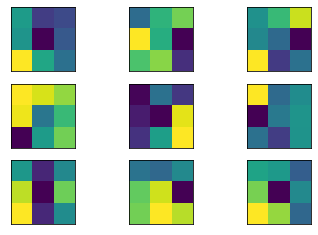

In [18]:
plot_first_6filters_oflayer(model_with_filters,'conv4_block22_2_conv',"late filters visualization after unfreezing first 6")

plot_first_6filters_oflayer(model_resnet,'conv4_block22_2_conv',"late filters visualization before unfreezing first 6")

filters in the first conv visualization after unfreezing first 6
conv1_conv (7, 7, 3, 64)


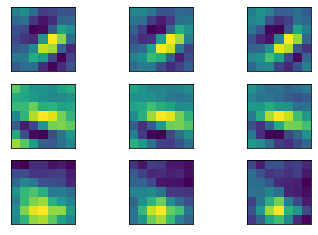

filters in the first conv visualization before unfreezing first 6
conv1_conv (7, 7, 3, 64)


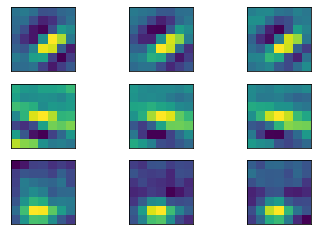

In [19]:
plot_first_6filters_oflayer(model_with_filters,'conv1_conv',"filters in the first conv visualization after unfreezing first 6")
plot_first_6filters_oflayer(model_resnet,'conv1_conv',"filters in the first conv visualization before unfreezing first 6")

### Clusters Learned by The Model

/srv/conda/envs/saturn/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/srv/conda/envs/saturn/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


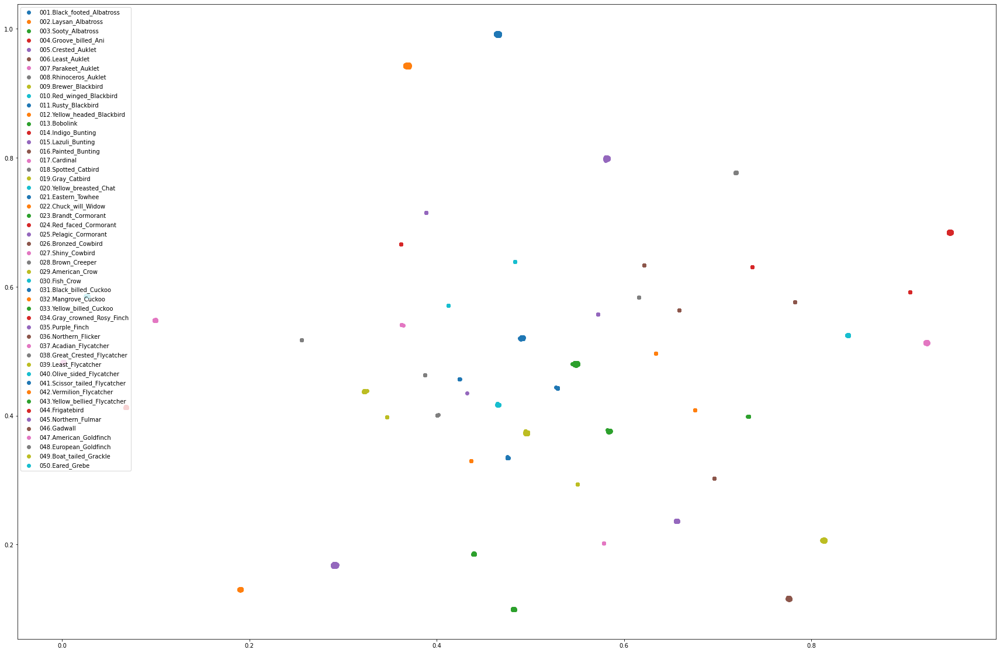

In [30]:
from sklearn.manifold import TSNE
import numpy as np
from  matplotlib import pyplot as plt



model2 = tf.keras.Model(inputs=model_with_filters.input, outputs=model_with_filters.layers[-1].output)
test_ds = np.concatenate(list(train_ressubset.take(100).map(lambda x, y : x))) # get 100 batches of images and convert to numpy array
features = model2(test_ds)
labels = np.argmax(model_with_filters(test_ds), axis=-1)
tsne = TSNE(n_components=2).fit_transform(features)

def scale_to_01_range(x):

    value_range = (np.max(x) - np.min(x))
    starts_from_zero = x - np.min(x)
    return starts_from_zero / value_range

tx = tsne[:, 0]
ty = tsne[:, 1]

tx = scale_to_01_range(tx)
ty = scale_to_01_range(ty)

#colors = ['red', 'blue', 'green', 'brown', 'yellow']
classes = train_resnet.class_names
#print(classes)
fig = plt.figure()
fig.set_size_inches(30,20)
ax = fig.add_subplot(111)
for idx, c in enumerate(classes[-50:]):
    indices = [i for i, l in enumerate(labels) if idx == l]
    current_tx = np.take(tx, indices)
    current_ty = np.take(ty, indices)
    ax.scatter(current_tx, current_ty, label=classes[idx])

ax.legend(loc='best')
plt.show()

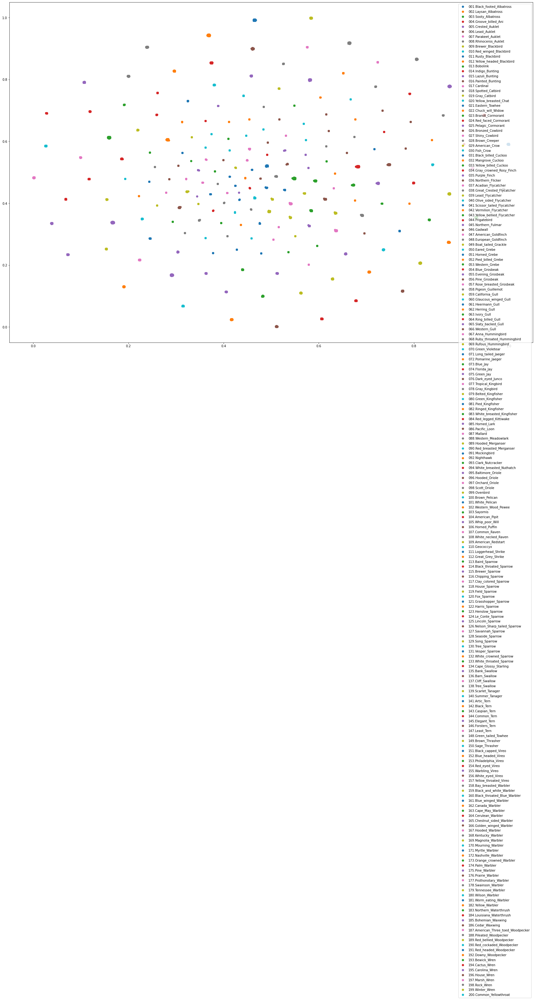

In [31]:
#All Classes
fig = plt.figure()
fig.set_size_inches(30,20)
ax = fig.add_subplot(111)
for idx, c in enumerate(classes):
    indices = [i for i, l in enumerate(labels) if idx == l]
    current_tx = np.take(tx, indices)
    current_ty = np.take(ty, indices)
    ax.scatter(current_tx, current_ty, label=classes[idx])

ax.legend(loc='best')
plt.show()

## Visualization Discussion
- I Visualized the first conv layer, middle layer and late layer before and after unfreezing. To see which are more affected with the training:
- All Layers -as seen from the heat maps of filters- were affected by the training cycle, ResNet architucture prevents vanishing gradients
- All parameters of all filters in the late layer were the most affected by the learning procedure:
- 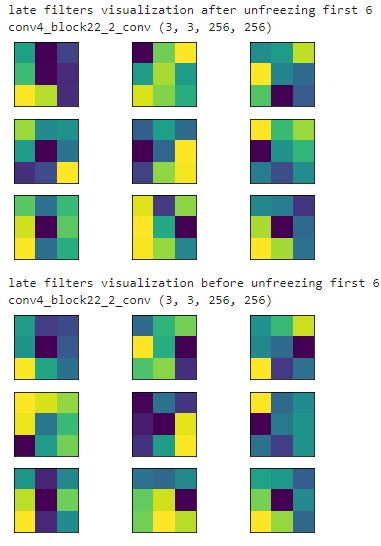
- Most of the parameters in the middle layer were the most affected by the learning procedure:
- 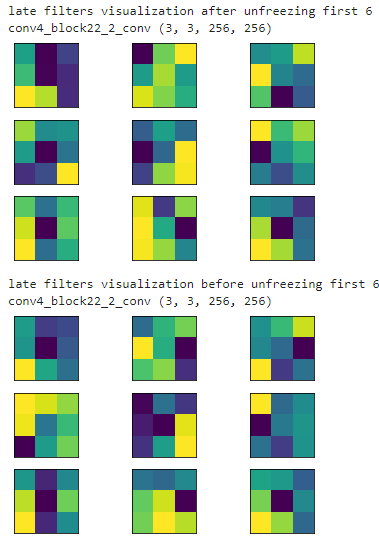
- Parameters in the first layer were the least affected.
- 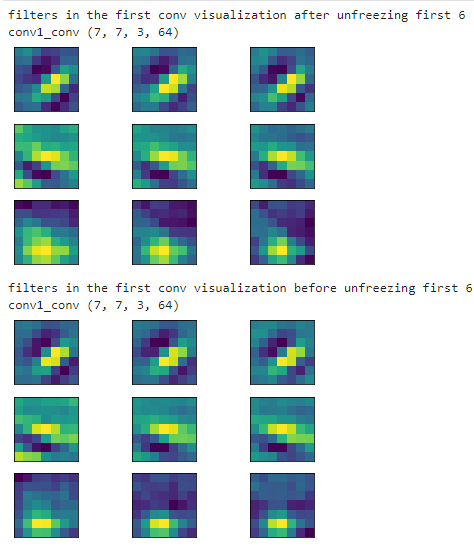
- TSNE visualization of the features learned by last dense layer shows a seperable clusters, where each cluster belongs to one class.